Author: Liam Huber `huber@mpie.de`

# pyiron for image data

This notebook demonstrates a new `ImageJob` job type, which allows the user to construct collections of images that can be saved to hdf5, and to do image processing leveraging the `skimage` library.

# Setup

As usual, we only need to import the `Project` class from `pyiron` to get access to the new job.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='retina'

from pyiron import Project

/Users/huber/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
pr = Project('image_demo')
pr.remove_jobs(recursive=True)
pr.get_repository_status()

This group does not exist in the HDF5 file image_job


,Module,Git head
0,pyiron_contrib,639a043ecb6b5add6be4c7fc388592eb1f046574
1,pyiron_mpie,011c8cdae3237d7c6dcd4e81a5624560ead0f32a
2,pyiron,aeeb93fb826800e869fd52215b9696d11e61af7e


In [3]:
job = pr.create_job(pr.job_type.ImageJob, 'image_job')

# Associating data

Next, we load image data onto the job. Numpy arrays containing image data can be used, but it is often easier to simply point the job to image file(s) where the data is stored.

Note: Right now, the image job only saves this source file to hdf5, not the image data itself. The data is only accessed when it is asked for. This is memory efficient and as fast as possible for the user, but it means that transformations made on the data are ephemeral -- modified images are not (presently) saved anywhere. There is also no safety check to prevent the user from associating an image file, then going to the filesystem and deleting this file -- this will simply cause the image job to throw an error when it tries to access that file again.

In [4]:
# Load data with a file pattern
job.add_images('datasets/HuBlastdata/HuTcellBl_B15E1_5800x_000*.tif', as_grey=True, 
               metadata={'cell': 'Human T'})

# Load an individual file
job.add_image('datasets/PrHu_data/Box15_N4_13500x.tif', as_grey=True,
              metadata={'cell': 'Human something'})

# Load a list of files
job.add_images(['datasets/BMMCdata/BMMC_1.tif','datasets/BMMCdata/BMMC_10.tif'], as_grey=True,
               metadata={'cell': 'Not saying it was aliens, but it was definitely aliens', 
                         'microscope': 'ZoomTron51'})


Note: I downloaded some TEM datasets (Human Blast, Primary Human B cell, and BMMC) from https://lmb.informatik.uni-freiburg.de/resources/datasets/tem.en.html and put them in the the relative directories shown above. To actually *run* this notebook, you need to do the same.

# Leverage skimage

Each `Image` object, a list of which are stored in the `images` attribute of our job, has access to all the submodules of `skimage`. These need to be activated to become fully accessible.

In [5]:
job.images.filters.activate()
job.images.segmentation.activate()
job.images.exposure.activate()

Note: We can use auto completion to see the available modules which can be activated. *Unfortunately* we can't use autocomplete when the images are all wrapped up in a list -- we can still *access* them this way (as seen above), it's just that the autocomplete can't see them! To get around this, you can always look at a single element to see what's available.

In [6]:
one_image = job.images[0]

In [7]:
# one_image.

The `filters` and `segmentation` modules have been activated, so we can see their contents in depth

In [8]:
# one_image.filters.

The `feature` module has not been activated, so we can't see its contents, only the attributes of the module-scraping class it belongs to.

In [9]:
# one_image.feature.

# The fun part

Now the fun part, we can apply various modifications to our data! We'll use `reload_data` to wipe our modifications and reset the data to its source values between consecutive calls.

- We can apply modifications to a subset of our images
- We can apply multiple consecutive modifications
- The order of application matters (edge detection + segmentation != segmentation + edge detection)

/Users/huber/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))
/Users/huber/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))


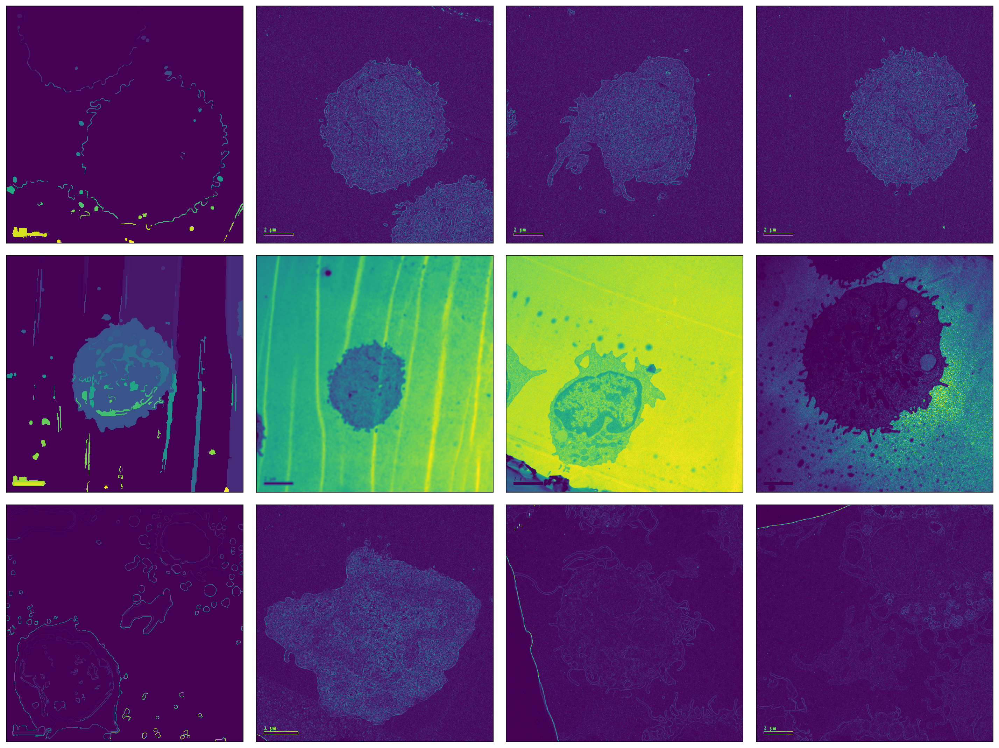

In [10]:
job.images.reload_data()

# Edge detection
job.images[:4].filters.sobel()  

# Change the contrast
job.images[7].exposure.adjust_gamma(5.)

# Smearing
job.images[5].filters.gaussian(sigma=3)

# Segmentation
job.images[[0, 4, 8]].segmentation.felzenszwalb(scale=200, sigma=3, min_size=100)  

# Edge detection
job.images[-4:].filters.sobel() 

# Plot
job.plot(subplots_kwargs={'figsize': (20, 15)});

# Metadata

We can also use the metadata to filter our data and look at subsets that match certain conditions.

For example, below we filter out all the cells that are definitely human.

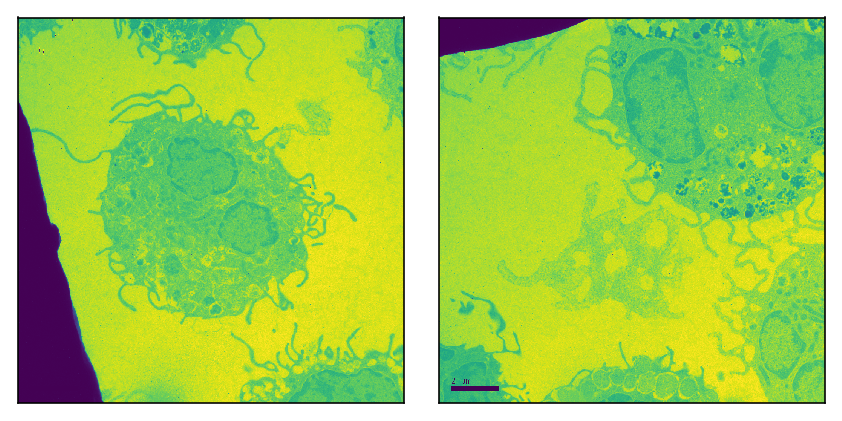

In [11]:
# Build a mask
possibly_inhuman_mask = np.argwhere(['human' not in cell for cell in job.images.metadata.cell.lower()]).flatten()

# Selectively reload just the data we're interested in
job.images[possibly_inhuman_mask].reload_data() 

# Plot a subset of data
job.plot(mask=list(possibly_inhuman_mask));

We could also look at other properties of the filtered data

In [12]:
job.images[possibly_inhuman_mask].metadata.cell

['Not saying it was aliens, but it was definitely aliens', 'Not saying it was aliens, but it was definitely aliens']

Of course there's nothing special about the fact metadata has `cell`, it's just a field we gave it. Some of them also had other metadata associated with them. Right now, metadata is unstructured and the users can store what they want there.

In [13]:
job.images[-1].metadata.microscope

'ZoomTron51'

# Permanence

These image jobs can act as a lasting way of collecting images together into a coherent set.

We can save the job to hdf5. Right now we don't save the (modified) data itself, but only the source to get the data from. Below we can see we can access it in the hdf5 directory directly

In [14]:
job.save()

770

In [15]:
pr['image_job/images/img0/source'], pr['image_job/images/img0/metadata/cell']

('datasets/HuBlastdata/HuTcellBl_B15E1_5800x_0001.tif', 'Human T')

We can also later come back and re-load the pyiron object and see the data that way

In [16]:
loaded_job = pr.load('image_job')
loaded_job.images.metadata.cell

['Human T', 'Human T', 'Human T', 'Human T', 'Human T', 'Human T', 'Human T', 'Human T', 'Human T', 'Human something', 'Not saying it was aliens, but it was definitely aliens', 'Not saying it was aliens, but it was definitely aliens']

# Outlook

Right now this is just a toy for grouping images and easily applying the same modifications to (subsets of) them and easily visualizing them.

The traditional pyiron `run` command does nothing!

In [17]:
job.run()

NotImplementedError: 

In the future we may want to do more serious computational lifting. In this case I envision that we may define some sort of computational pipeline in the input, then we can crank up the number of cores and send it off to run on some remote node

```python
job.input.pipeline = [
    foo,
    bar,
    baz
]
job.server.queue = 'some_remote_queue'
job.server.cores = 20
job.run()
```

Since these modifications to the images are, presumably, expensive, we want to save them instead of throwing them away like we currently do. Then they might be later excessible in something like `job.output.processed_data`.

We could imagine parallelization by giving the input pipeline operations access to more cores, and/or by parallelizing the input pipeline over the images it's being run on.

In the longer run, one can also imagine some nice connections to a pyiron module for machine learning. The user experience might look something like this:

```python
# Load a collection of labeled and unlabeled data for image classification
image_job = pr.create_job(pr.job_type.ImageJob, 'image_job')
image_job.add_images('path/to/collection/img*.png', metadata={'type': 'labeled_data'})
labels = np.fromtxt('/path/to/collection/labels.txt')[:, 1]
for img, label in zip(image_job.images, labels):
    img.metadata.label = label
image_job.add_images('path/to/other_larger_collection/img*.png', metadata={'type': 'unlabeled_data'})

# Set up a convolutional neural network and train it on the labeled image data
ml_job = pr.create_job(pr.job_type.ConvNet, 'ml_job')
ml_job.input.training_data.data = image_job.images[image_job.images.metadata.type == 'labeled_data'].data
ml_job.input.training_data.labels = image_job.images[image_job.images.metadata.type == 'labeled_data'].metadata.label
ml_job.server.queue = 'remote'
ml_job.server.cores = 20
ml_job.run()

# Wait for the submit job to finish...
pr.job_table()

# Set up the image job to apply the ML filter to the many unlabeled images
image_job.input.pipeline = [
    ml_job.predict
]
unlabeled_mask = image_job.images.metadata.type == 'unlabeled_data'
image_job.input.mask = unlabeled_mask
image_job.input.server.queue = 'remote'
image_job.input.server.cores = 10
image_job.run()

# Wait for the submit job to finish...

# Apply the new labels
image_job.images[unlabeled_mask].metadata.predicted_label = image_job.output.pipeline_output

# Poke your nose into things
image_job.images[
    image_job.images.metadata.predicted_label == 'crack_tip' or image_job.images.metadata.label == 'crack_tip'
].plot()
```

Of course one might come up with a better way to handle the separation of concerns, and some of that syntax isn't running at the time of writing (e.g. `image_job.images.metadata.foo == val` to make boolean list), etc..., but that gives the basic sort of idea I'm thinking of at the moment